In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os
import sys

sc.settings.set_figure_params(dpi=80)
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

In [2]:
sys.path.append(os.path.abspath('../'))

In [3]:
from utils import tresholds, layer_palette, apply_percentile_treshold, apply_upper_treshold

### Global environment

In [4]:
qc_palette = sns.color_palette(['red', 'gray'])

In [5]:
# Define paths and get sample_ids
file_list = os.listdir('../../data/raw_spatial_data/spatial_libd_human/')
file_list

['151507',
 '151508',
 '151509',
 '151510',
 '151669',
 '151670',
 '151671',
 '151672',
 '151673',
 '151674',
 '151675',
 '151676',
 'load.sh']

In [6]:
file = '151669'

# Load the data

In [7]:
# layer annotation
ann = pd.read_csv('../../data/clusters/spatial_LIBD.tsv', index_col=0, sep='\t', header=None, names=['sample_id', 'label'])
ann = ann[ann.sample_id == int(file)]
ann

,sample_id,label
AAACAAGTATCTCCCA-1,151669,L4
AAACACCAATAACTGC-1,151669,L6
AAACAGAGCGACTCCT-1,151669,L3
AAACAGGGTCTATATT-1,151669,L4
AAACATTTCCCGGATT-1,151669,L6
...,...,...
TTGTTGTGTGTCAAGA-1,151669,L3
TTGTTTCACATCCAGG-1,151669,L6
TTGTTTCATTAGTCTA-1,151669,L6
TTGTTTCCATACAACT-1,151669,L5


In [8]:
# expression
adata = sc.read_visium('../../data/raw_spatial_data/spatial_libd_human/'+ file)
adata.var_names_make_unique()
adata.obs['label'] = ann.label
adata.obs['sample_id'] = file

reading ..\..\data\raw_spatial_data\spatial_libd_human\151669\filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Проверим все ли споты имеют аннотацию

In [9]:
adata.obs.label.value_counts()

L3    2141
L5     510
L6     391
L4     364
WM     230
Name: label, dtype: int64

In [10]:
adata.obs.label.notna().value_counts()

True     3636
False      25
Name: label, dtype: int64

# Adata

## Metrics

In [11]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

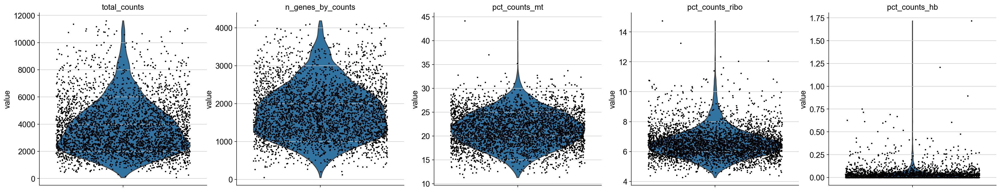

In [12]:
sc.pl.violin(adata,
             keys = ['total_counts', 'n_genes_by_counts','pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

Lets look at separate layers

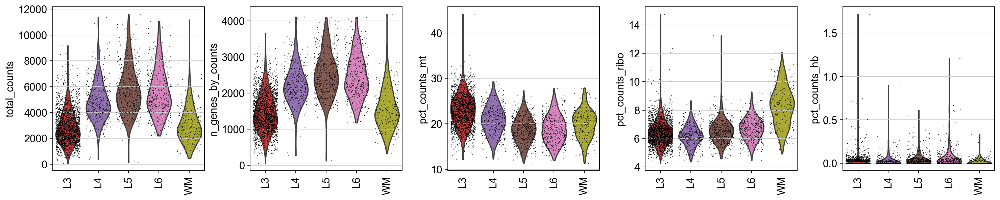

In [13]:
sc.pl.violin(adata,
             keys = ['total_counts', 'n_genes_by_counts','pct_counts_mt','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Lets look at spatial distribution

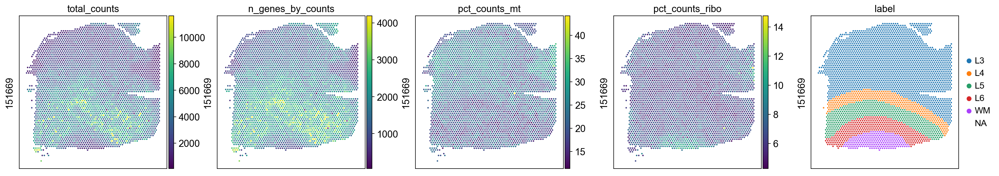

In [14]:
sq.pl.spatial_scatter(adata,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_mt','pct_counts_ribo', 'label'],
                      ncols=5, img=False, axis_label=['', file])

### Libriary size

Lets look at histogram

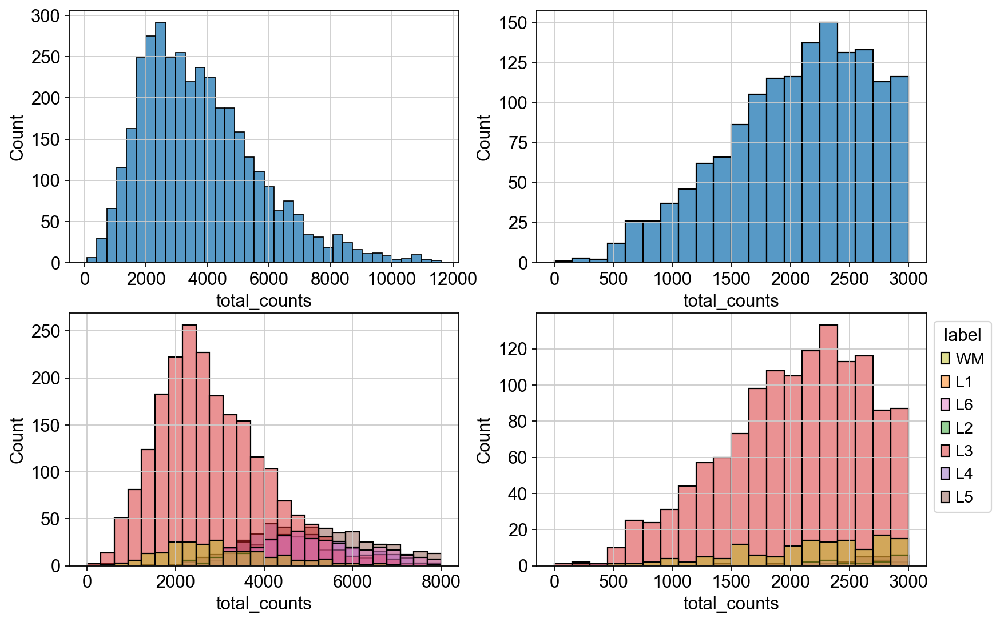

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 8000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Calculate thresholds for each layer

In [16]:
apply_percentile_treshold(adata, 'total_counts')

Всего образцов не прошедших трешхолд: 78


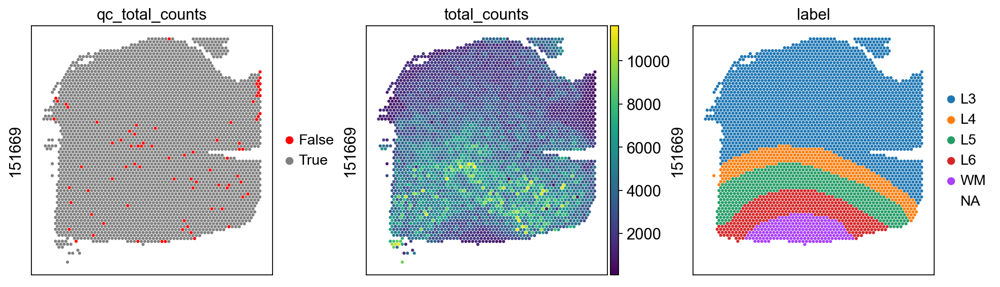

In [17]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_total_counts', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

Lets look at histogram

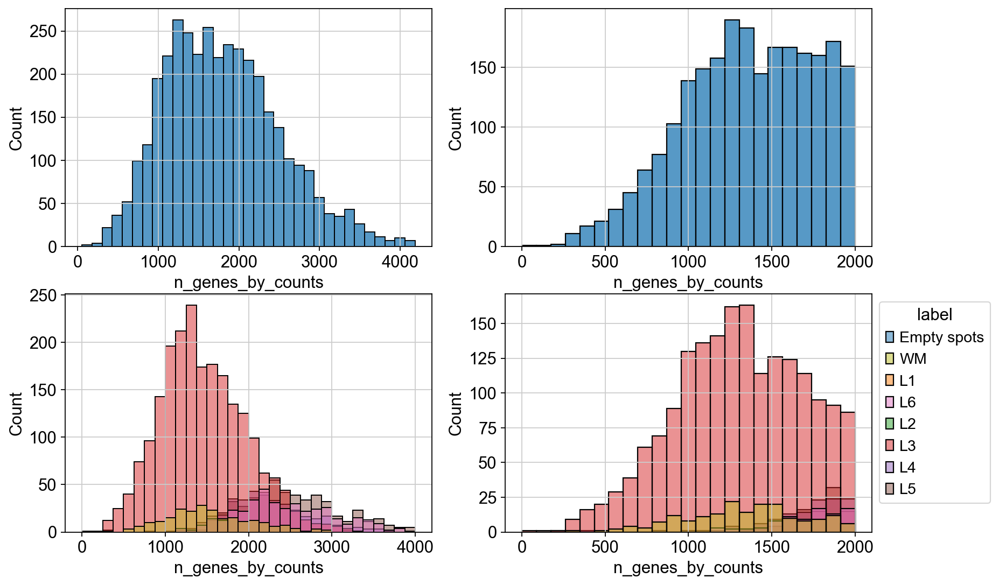

In [18]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Calculate thresholds for each layer

In [19]:
apply_percentile_treshold(adata, 'n_genes_by_counts', right_bound=False)

Всего образцов не прошедших трешхолд: 74


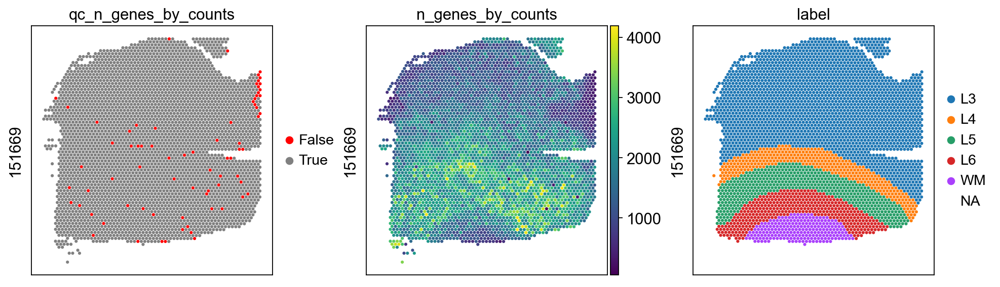

In [20]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_n_genes_by_counts', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of mitochondrial reads

Filter spots

In [21]:
apply_upper_treshold(adata, 'pct_counts_mt')

Трешхолд равняется : 25
Всего образцов не прошедших трешхолд: 634
label
L3    567
L4     37
WM     12
L6     11
L5      5
Name: label, dtype: int64


Lets look at histogram

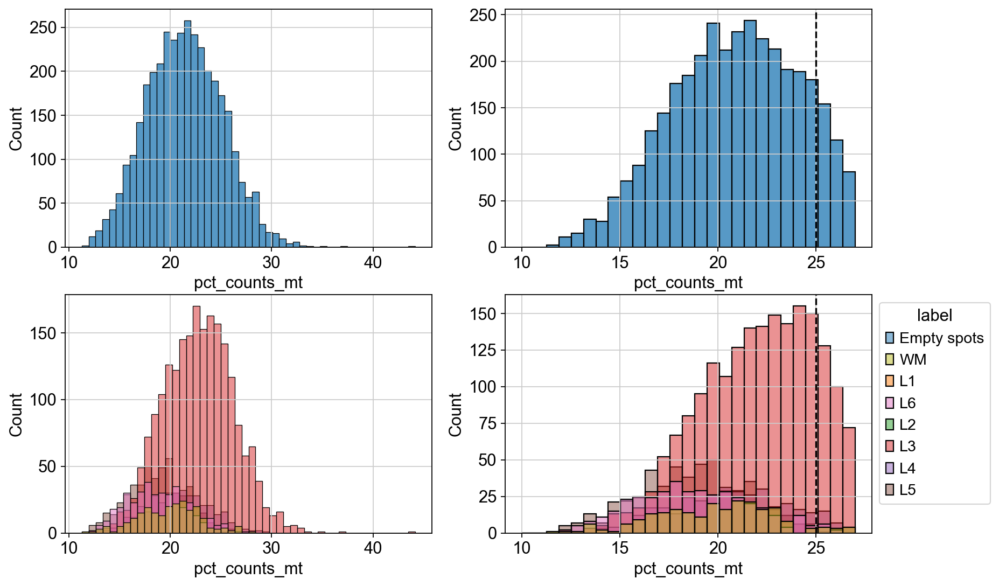

In [22]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_mt', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_mt', hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[10, 27], ax=axs[0][1])
axs[0][1].axvline(x=tresholds['pct_counts_mt'], color="black", linestyle="--")
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[10, 27], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
axs[1][1].axvline(x=tresholds['pct_counts_mt'], color="black", linestyle="--")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

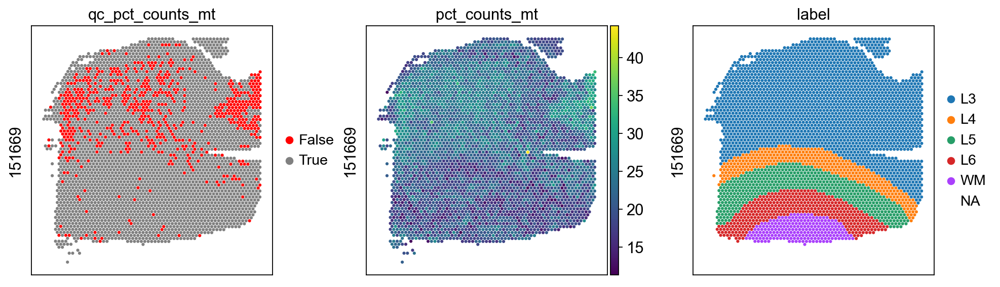

In [23]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_pct_counts_mt', 'pct_counts_mt', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of ribosomal reads

In [24]:
apply_upper_treshold(adata, 'pct_counts_ribo')

Трешхолд равняется : 22
Всего образцов не прошедших трешхолд: 0


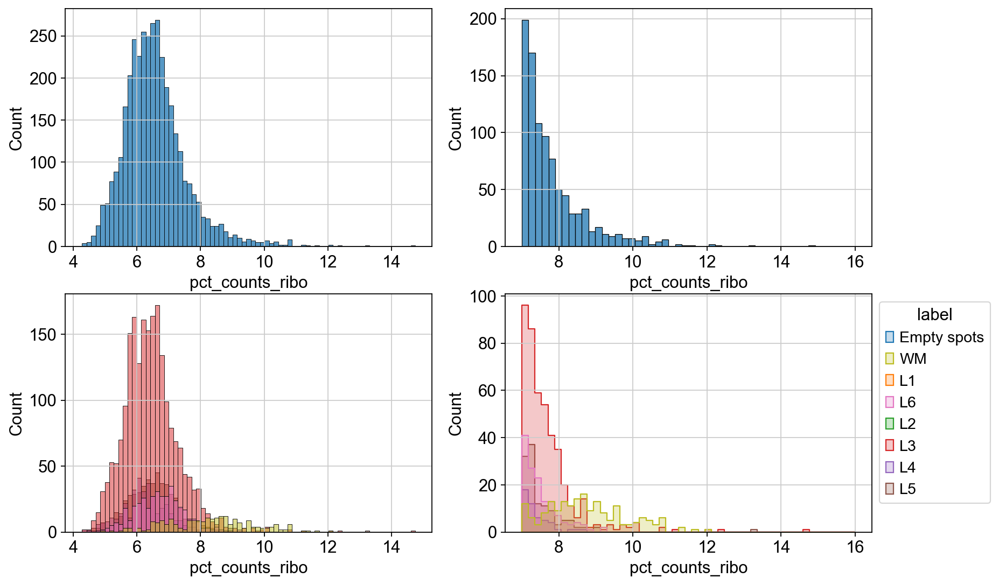

In [25]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_ribo', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_ribo', hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

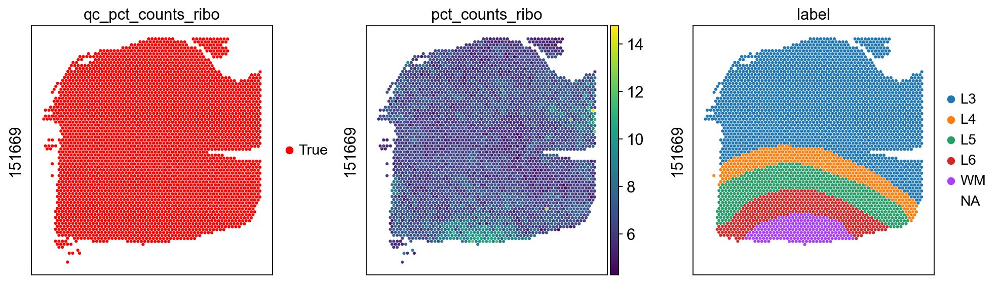

In [26]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_pct_counts_ribo', 'pct_counts_ribo', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of hemoglobin reads

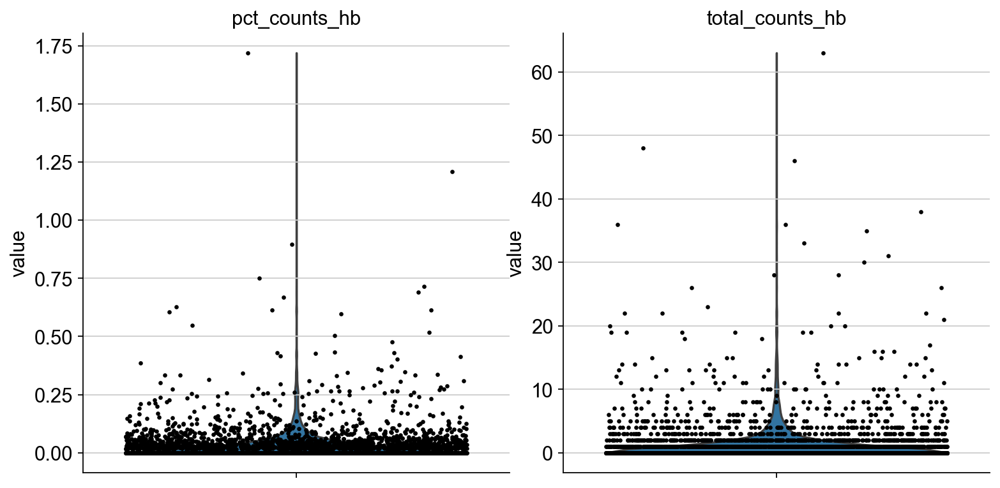

In [27]:
sc.pl.violin(adata,
             keys = ['pct_counts_hb', 'total_counts_hb'], jitter=0.4, size=3, multi_panel=True)

In [28]:
apply_upper_treshold(adata, 'pct_counts_hb')

Трешхолд равняется : 2
Всего образцов не прошедших трешхолд: 0


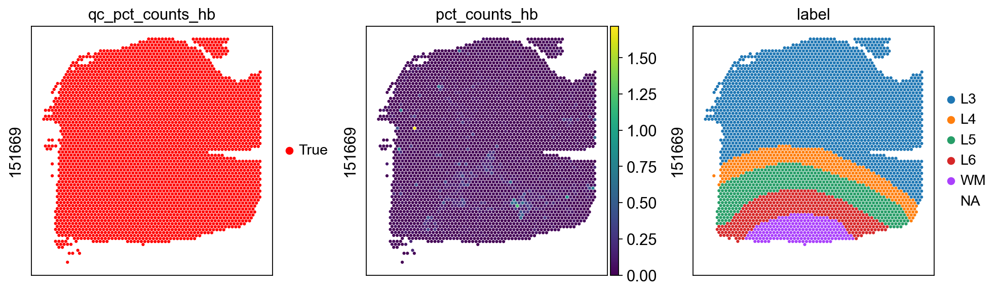

In [29]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_pct_counts_hb', 'pct_counts_hb', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC spatial_scatter

In [30]:
adata.obs['qc_total_counts'].astype(bool).value_counts()

True    3661
Name: qc_total_counts, dtype: int64

In [31]:
d = {'True': True, 'False': False}
adata.obs['qc_total_counts'].replace(d, inplace=True)
adata.obs['qc_n_genes_by_counts'].replace(d, inplace=True)
adata.obs['qc_pct_counts_mt'].replace(d, inplace=True)
adata.obs['qc_pct_counts_ribo'].replace(d, inplace=True)
adata.obs['qc_pct_counts_hb'].replace(d, inplace=True)

In [32]:
adata.obs['qc_good_spots'] = (adata.obs.qc_total_counts.astype(bool) * adata.obs.qc_n_genes_by_counts.astype(bool) * adata.obs.qc_pct_counts_mt.astype(bool) *
                              adata.obs.qc_pct_counts_ribo.astype(bool) * adata.obs.qc_pct_counts_hb.astype(bool)).astype('string')
vc = adata.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"Число образцов не прошедших порог N={adata.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

Число образцов не прошедших порог N=700

label
L3    597
L4     42
L6     21
L5     20
WM     18
Name: label, dtype: int64


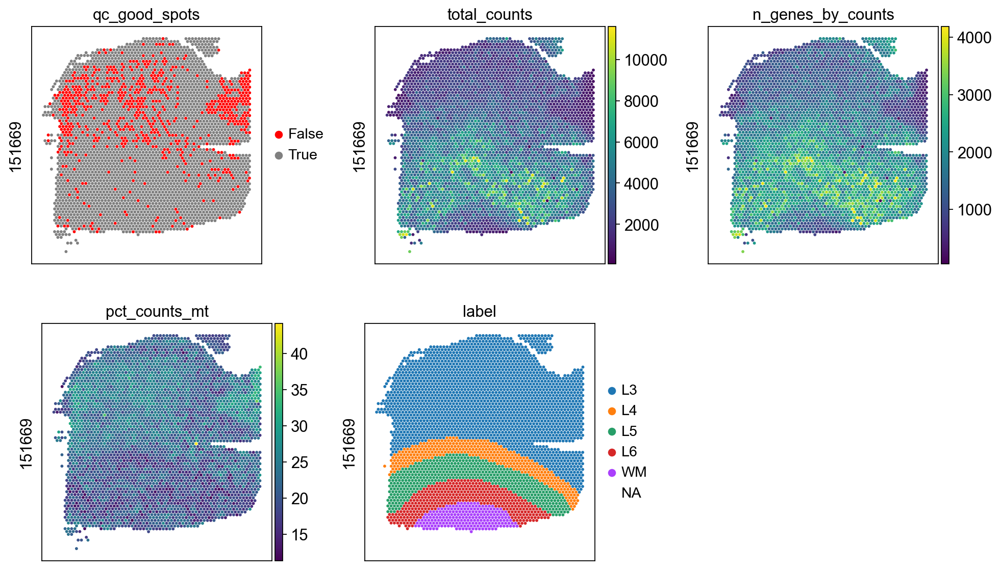

In [33]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=3)

### QC scatter plots

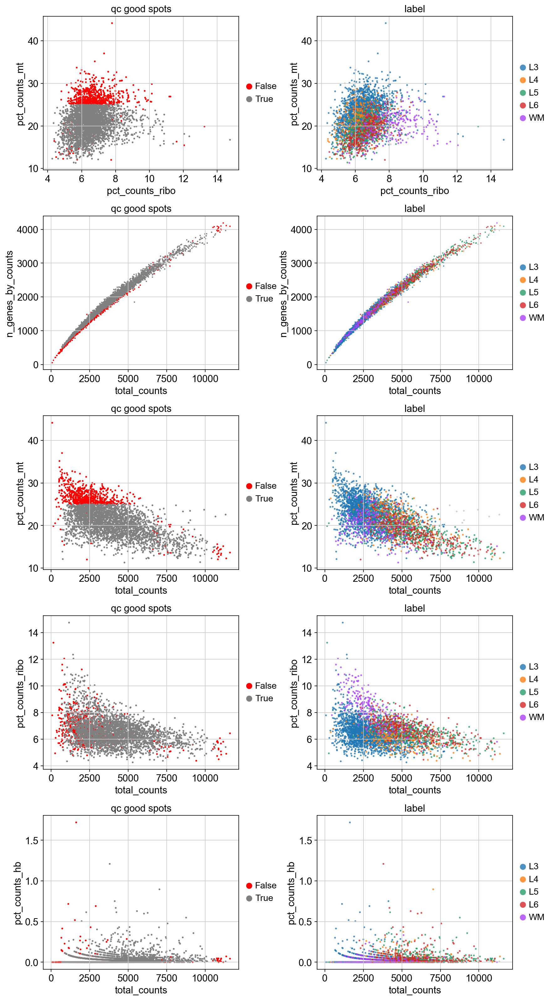

In [34]:
fig, ax = plt.subplots(5, 2, figsize=(12, 25), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8

sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="qc_good_spots", ax=ax[0][0], show=False, size=25)
sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="label", ax=ax[0][1], show=False, size=25, alpha=alpha)

sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[1][0], show=False, size=15)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[1][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[3][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[3][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[4][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="label", ax=ax[4][1], show=False, alpha=alpha, size=25)
plt.show()

### Save filtered spots

In [35]:
good_spots = adata.obs[(adata.obs.qc_good_spots == 'True') &
                           (adata.obs.label != 'Empty spots') &
                           (adata.obs.label.notna())].index

In [36]:
adata_filtered = adata[good_spots].copy()

### PCA

In [37]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:35)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


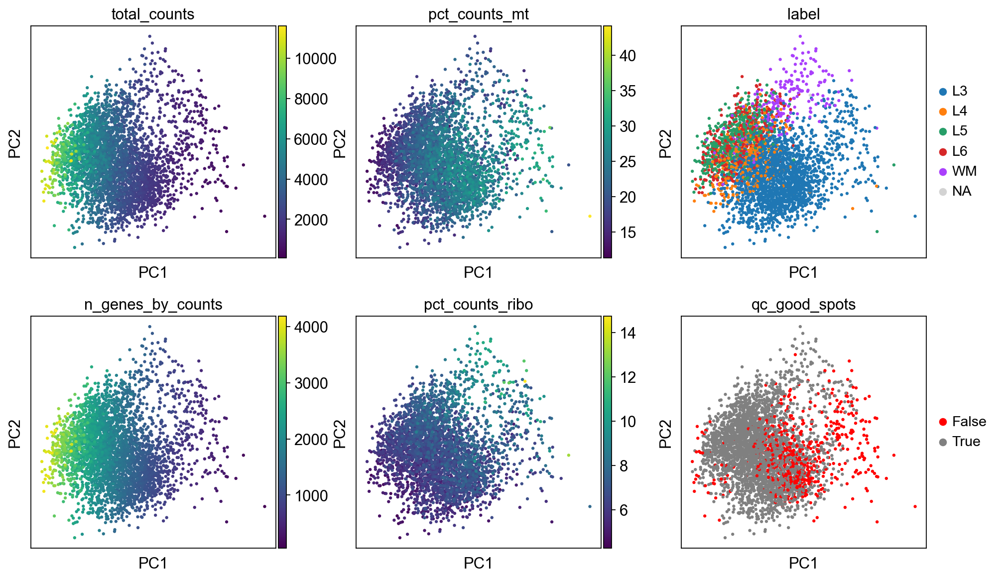

In [38]:
sc.pl.pca(adata, 
          color=['total_counts','pct_counts_mt', 'label', 'n_genes_by_counts',  'pct_counts_ribo', 'qc_good_spots'],
          ncols=3, show=True)

## Save to .h5ad

In [39]:
adata_filtered.obs.drop(['qc_total_counts','qc_n_genes_by_counts',
                         'qc_pct_counts_mt', 'qc_good_spots',
                         'qc_pct_counts_hb', 'qc_pct_counts_ribo'], axis=1, inplace=True)

In [40]:
os.makedirs('../../results/filtered_samples', exist_ok=True)
os.makedirs('../../results/filtered_samples/human', exist_ok=True)
adata_filtered.write_h5ad(f'../../results/filtered_samples/libd/{file}.h5ad')